In [2]:
# MAKE SURE YOU'RE IN YOUR CONDA ENVIRONMENT BEFORE INSTALLING ANYTHING !!!!
#!pip install tensorflow
#!pip install pillow
#!pip install scipy
#!pip install matplotlib

In [9]:
import tensorflow as tf
import PIL
from PIL import Image
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (Dropout, Dense, Softmax)
from tensorflow.keras.applications import mobilenet as _mobilenet
import random
import os
import numpy as np
from subprocess import call
import scipy
import matplotlib.pyplot as plt
from matplotlib import cm
import math
from decimal import Decimal, localcontext

from pathlib import Path




def opF(path):
    p = Path(path)
    
    # different methods depending on windows or mac (comment out the one you don't need)
    
    # os.startfile(p) # for Windows
    _ = call(['open',p]) # for Mac/Linux

----
<br> </br>
<br> </br>

<br> </br>

<br> </br>



//

#### _BARC: 0053 SKILLS MODULE _


----
# 01 - Video and Image Classification
#### _Julian Besems_

----

##### 31_10_2023

<br></br>
<br></br>

<br></br>


------

# 1 Introduction


## _Ever more detailed but only the suggestion of complexity within geometric detail and specificity_

![SegmentLocal](Resources/RevitShowreelOuttake.mp4 "showreel")
_Autodesk Revit Software | Get Prices & Buy Official Revit 2024 (no date). Available at: https://www.autodesk.eu/products/revit/overview (Accessed: 24 September 2023)._

## The broader complexity of architecture provided by its inherent multi-facetted nature is absent in this manner of encoding the architectural project.

In [10]:
opF('Resources/quotes/Vitruvius_1960_Education.png')

_Vitruvius (1960) The Ten Books on Architecture. Translated by M.H. Morgan. New York: Dover Publications inc._

## In contrast to the 3D CAD model, computational encoding is NOT bound to 3 dimensions
---
## _An example of a ML encoding to look at images of gardens_

In [5]:
def load_image(img_file, target_size=(224,224)):
    X = np.zeros((1, *target_size, 3))
    X[0, ] = np.asarray(tf.keras.preprocessing.image.load_img(
        img_file, 
        target_size=target_size)
    )
    X = tf.keras.applications.mobilenet.preprocess_input(X)
    return X

def ensure_folder_exists(folder):
    if not os.path.exists(folder):
        os.makedirs(folder)

In [6]:
model = tf.keras.applications.mobilenet.MobileNet(
# The 3 is the three dimensions of the input: r,g,b.
  input_shape=(224, 224, 3), 
  include_top=True, 
  pooling='avg'
)

ryoanJi_Path = "Resources/ryoanJiPhoto.jpg"
opF(ryoanJi_Path)

ryoanJi_image = load_image(ryoanJi_Path)
featureRyoanJi = model.predict(ryoanJi_image)[0]

2023-10-31 22:54:56.401194: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1 Max
2023-10-31 22:54:56.401223: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 64.00 GB
2023-10-31 22:54:56.401233: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 24.00 GB
2023-10-31 22:54:56.401287: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-10-31 22:54:56.401490: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2023-10-31 22:54:57.719834: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 1s/step


In [7]:
featureRyoanJi.size

1000

In [8]:
featureRyoanJi

array([1.18518926e-06, 3.19821720e-06, 2.91369743e-05, 2.19659137e-06,
       1.48565405e-05, 3.26491063e-05, 3.07258342e-05, 8.74990801e-05,
       9.74938957e-05, 1.44082867e-02, 3.97903677e-05, 2.41840144e-06,
       1.06220024e-04, 3.96390931e-07, 1.33975118e-06, 4.60419629e-04,
       4.30799992e-06, 3.73992009e-07, 1.27387955e-06, 1.69934128e-06,
       1.37960865e-06, 2.29764028e-05, 1.99380069e-04, 2.60406174e-04,
       1.08574772e-04, 7.54004068e-05, 6.22349180e-05, 5.36869593e-05,
       7.94396237e-06, 3.03304150e-05, 2.68668146e-03, 4.34948379e-06,
       8.65185447e-03, 1.14353886e-03, 7.68743164e-04, 5.17695094e-04,
       7.67525984e-03, 3.07012728e-04, 5.23693852e-05, 1.16222305e-03,
       2.76564947e-06, 5.21848968e-04, 2.29829660e-04, 1.10734499e-03,
       6.20831386e-04, 4.00917185e-03, 1.07278220e-05, 2.33815241e-04,
       4.53117042e-04, 5.09615541e-02, 1.39707848e-01, 6.27406189e-05,
       9.85091101e-05, 7.55740120e-06, 1.07042659e-02, 8.83853863e-06,
      

In [9]:
sankeiEn = "Resources/SankeiEnPhoto.jpg"
opF(sankeiEn)
sankeiEn_image = load_image(sankeiEn)
featureSankeiEn = model.predict(sankeiEn_image)[0]

englishGarden = "Resources/englishGardenPhoto.jpg"
opF(englishGarden)
englishGarden_image = load_image(englishGarden)
featureEnglishGarden = model.predict(englishGarden_image)[0]

1/1 [==============================] - 0s 20ms/step


In [10]:
np.linalg.norm(featureRyoanJi - featureSankeiEn)

0.5411715

In [11]:
np.linalg.norm(featureRyoanJi - featureEnglishGarden)

1.0382752

In [12]:
np.linalg.norm(featureSankeiEn - featureEnglishGarden)

1.0858923

# Motivation

In [13]:
opF('Resources/quotes/Valery_1989_102.png')

_Valéry, P. (1989) Collected Works of Paul Valery, Volume 4: Dialogues. Princeton University Press._

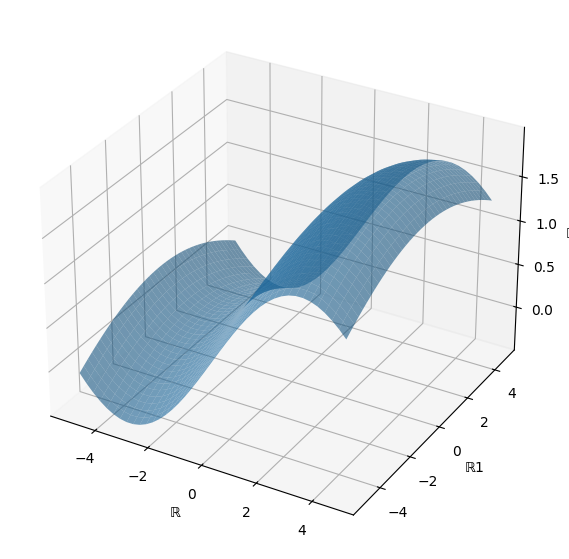

In [14]:
fig = plt.figure(figsize = (7,7))
ax= fig.add_subplot(111, projection= '3d')
ax = fig.gca()

X = np.arange(-5, 5, 0.25)
Y = np.arange(-5, 5, 0.25)
X, Y = np.meshgrid(X, Y)

Z = np.sin(X/2+2)**2 + np.cos(Y/3)**3/3
Z = np.sin(X/2) + np.cos(Y/3)
Z = np.sin(X/2) + np.cos(Y/5)

ax.plot_surface(X, Y, Z, rstride=1, cstride=1, alpha=0.6)

ax.set_xlabel('ℝ')
#ax.set_xlim(-40, 40)
ax.set_ylabel('ℝ1')
#ax.set_ylim(-40, 40)
ax.set_zlabel('ℝ2')
#ax.set_zlim(-100, 100)

plt.show()

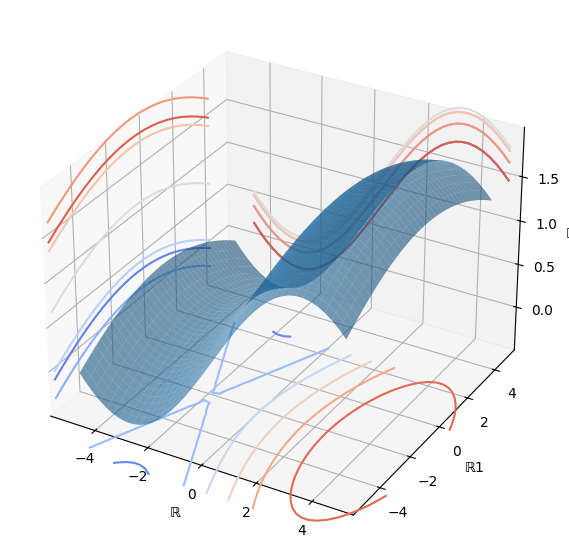

In [15]:
fig = plt.figure(figsize = (7,7))
ax= fig.add_subplot(111, projection= '3d')
ax = fig.gca()

ax.plot_surface(X, Y, Z, rstride=1, cstride=1, alpha=0.6)
cset = ax.contour(X, Y, Z, zdir='z', offset=-1, cmap=cm.coolwarm)
cset = ax.contour(X, Y, Z, zdir='x', offset=-6, cmap=cm.coolwarm)
cset = ax.contour(X, Y, Z, zdir='y', offset=6, cmap=cm.coolwarm)

ax.set_xlabel('ℝ')
#ax.set_xlim(-5, 5)
ax.set_ylabel('ℝ1')
#ax.set_ylim(-5, 5)
ax.set_zlabel('ℝ2')
#ax.set_zlim(-1, 1)

plt.show()

## The singularity of the architectural project through internalisation within Cartesian space and the rhetoric of code diminishes the realm of association and communications between domains and objects

In [16]:
opF('Resources/quotes/Yaneva_2009_86.png')

_Yaneva, A. (2009) Made by the Office for Metropolitan Architecture: An Ethnography of Design._

## The reference to the project as an idea is lost, as such there is no encoding, just code.

----


### If something has been put through computation it is not inevitable that the artefact will be flattened if it must be represented as 1s and 0s.

### _The potential of computation to encode beyond internalisation was already identified by Ada Lovelace through her insight for the potential of numerical encoding to offer another space to think in._

In [17]:
opF('Resources/Lovelace1.jpg')

### These considerations are necessary to make the emerging abstraction accessible, and something that can be entered instead of it becoming a closed system.

In [18]:
opF('Resources/quotes/Ishigami_2012_41.HEIC')

_Ishigami, J. (2012) Small Images. Tokyo: LIXIL Publishing._

## Using ML methods the projection from a domain to co-domain does not need to rely on deterministic functions but instead follows contingent relations established through associations of data.

_Lazarou, C. (2020) This Will Change the Way You Look at GANs, Medium. Available at: https://towardsdatascience.com/this-will-change-the-way-you-look-at-gans-9992af250454 (Accessed: 24 September 2023)._

## Probabilistic Domain

![SegmentLocal](Resources/ML/probabilisticPoints.gif "probabilistic")

## Cartesian Points

![SegmentLocal](Resources/ML/cartesianPoints.gif "CartesianDomain")

## Internal projections (SOM, T-SNE) of qualitative data beyond 3D of geometry, connected to the multidiscplinary nature mentioned by Vitruvius. 



In [19]:
opF('Resources/FilmSomReformat.mp4')

In [20]:
opF('Resources/quotes/Koolhaas_2022_23.png')

## The complete internalisation of architectural design into a computational model through Cartesian encoding is unable to successfully communicate abstractions of a design process.

In [21]:
math.sqrt(2)

1.4142135623730951

In [22]:
with localcontext() as ctx:
    ctx.prec = 5000
    print(Decimal(2).sqrt())

1.41421356237309504880168872420969807856967187537694807317667973799073247846210703885038753432764157273501384623091229702492483605585073721264412149709993583141322266592750559275579995050115278206057147010955997160597027453459686201472851741864088919860955232923048430871432145083976260362799525140798968725339654633180882964062061525835239505474575028775996172983557522033753185701135437460340849884716038689997069900481503054402779031645424782306849293691862158057846311159666871301301561856898723723528850926486124949771542183342042856860601468247207714358548741556570696776537202264854470158588016207584749226572260020855844665214583988939443709265918003113882464681570826301005948587040031864803421948972782906410450726368813137398552561173220402450912277002269411275736272804957381089675040183698683684507257993647290607629969413804756548237289971803268024744206292691248590521810044598421505911202494413417285314781058036033710773091828693147101711116839165817268894197587165821521282295184884

![SegmentLocal](Resources/sqrt2.png "sqrt 2")

## In a similar way there are aspects of architectural design that can be sought to be expressed through the proportionality of its parts, understood through the perception and operations that relate to them.

In [23]:
opF('Resources/quotes/Ishigami_2012_122.png')

_Ishigami, J. (2012) Small Images. Tokyo: LIXIL Publishing._

## The technics of computation can be seen in a similar manner to that of the perspective drawing of Alberti in the 15th Century. It does not directly lead to a means of creating, instead it is first and foremost a technic of communication, a way of communicating the idea of the design in novel ways.

![SegmentLocal](Resources/Alberti1.jpg "sqrt 2")

-------

# Image Classification
## Let's have a look at the mobilenet


In [24]:
model = tf.keras.applications.mobilenet.MobileNet()
model.summary()

Model: "mobilenet_1.00_224"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 32)      864       
                                                                 
 conv1_bn (BatchNormalizati  (None, 112, 112, 32)      128       
 on)                                                             
                                                                 
 conv1_relu (ReLU)           (None, 112, 112, 32)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D  (None, 112, 112, 32)      288       
 )                                                               
                                                                 
 conv_dw_1_bn (BatchNormali  (None, 112, 112, 32

 )                                                               
                                                                 
 conv_dw_8_bn (BatchNormali  (None, 14, 14, 512)       2048      
 zation)                                                         
                                                                 
 conv_dw_8_relu (ReLU)       (None, 14, 14, 512)       0         
                                                                 
 conv_pw_8 (Conv2D)          (None, 14, 14, 512)       262144    
                                                                 
 conv_pw_8_bn (BatchNormali  (None, 14, 14, 512)       2048      
 zation)                                                         
                                                                 
 conv_pw_8_relu (ReLU)       (None, 14, 14, 512)       0         
                                                                 
 conv_dw_9 (DepthwiseConv2D  (None, 14, 14, 512)       4608      
 )        

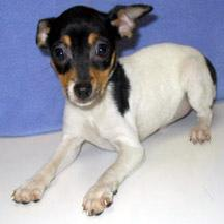

In [25]:
dog_image_id = os.listdir('Images/dog')[0]
dog_path = os.path.join('Images/dog',dog_image_id)
dog_image = load_image(dog_path)

tf.keras.preprocessing.image.load_img(dog_path, target_size=(224,224))

In [26]:
print(f'shape: {dog_image.shape}')
print(f'type: {type(dog_image)}')

shape: (1, 224, 224, 3)
type: <class 'numpy.ndarray'>


In [27]:
model.predict(dog_image)

1/1 [==============================] - 0s 259ms/step


array([[9.34026079e-10, 1.04797671e-09, 4.32995972e-10, 1.10834529e-10,
        7.65068342e-10, 1.15446219e-09, 1.34118494e-10, 9.48651602e-10,
        9.65599822e-10, 2.83289475e-10, 1.17563637e-09, 9.81460191e-11,
        5.47756588e-12, 1.67257926e-11, 3.99535509e-11, 4.47507448e-10,
        1.17475329e-09, 3.12533888e-10, 1.87477686e-10, 4.03398634e-11,
        1.62942160e-10, 1.01490116e-09, 3.26781701e-12, 1.20910851e-10,
        9.45560297e-11, 8.76109425e-08, 1.58981877e-07, 4.00121580e-09,
        8.65086918e-08, 6.33443662e-08, 5.97196914e-09, 1.27448541e-08,
        2.36626263e-07, 1.36409319e-08, 6.61448840e-10, 9.29702182e-09,
        4.49772708e-09, 1.17676100e-08, 1.76521155e-07, 7.59372343e-10,
        7.61680219e-10, 5.19556025e-08, 4.76850559e-08, 4.58359484e-09,
        4.43842438e-08, 1.00838369e-08, 1.36488110e-09, 9.00916053e-09,
        2.17992888e-10, 7.95866928e-10, 1.19040067e-08, 4.23021724e-08,
        3.50324925e-08, 1.41437209e-08, 5.22548183e-09, 5.166433

note that the array of features is embedded in another array, in another. 

# Now continue without the last layer

In [28]:
model = tf.keras.applications.mobilenet.MobileNet(
# The 3 is the three dimensions of the input: r,g,b.
  input_shape=(224, 224, 3), 
  include_top=False, 
  pooling='avg'
)

In [29]:
dog_image = load_image(dog_path)
f = model.predict(dog_image)

1/1 [==============================] - 0s 250ms/step


In [30]:
print(f)

[[0.05007511 0.         0.00301468 ... 0.0779054  1.5952206  0.8838989 ]]


In [31]:
x = Dropout(rate=0.4)(model.output)
# This determines the number of outputs, and thus the number of categories, in my test case 2: dog or cat
x = Dense(2)(x)
x = Softmax()(x)
model= Model(model.inputs, x)

In [32]:
for layer in model.layers[:-3]:
    layer.trainable = False

In [33]:
from tensorflow.keras.optimizers import Adam
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy'
)

In [34]:
datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    preprocessing_function=_mobilenet.preprocess_input,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.1
)

ensure_folder_exists('training_aug')
training = datagen.flow_from_directory( 
    'Images', 
    target_size=(224, 224),
    save_to_dir='./training_aug',
    subset='training'
) 

ensure_folder_exists('validation_aug')
validation = datagen.flow_from_directory( 
    'Images',
    target_size=(224, 224),
    save_to_dir='./validation_aug',
    subset='validation'
) 

Found 555 images belonging to 2 classes.
Found 61 images belonging to 2 classes.


In [35]:
batch_size = 32

history = model.fit(
    x=training,
    steps_per_epoch=training.samples // batch_size,
    # this needs to be much higher than 1, but for demo here we'll keep it at this
    epochs=2,
    validation_data=validation,
    validation_steps=validation.samples // batch_size
)

Epoch 1/2


2023-10-31 22:56:10.372815: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node Adam/AssignAddVariableOp.


17/17 [==============================] - 14s 675ms/step - loss: 0.7078 - val_loss: 0.3200
Epoch 2/2
17/17 [==============================] - 12s 709ms/step - loss: 0.2055 - val_loss: 0.3176


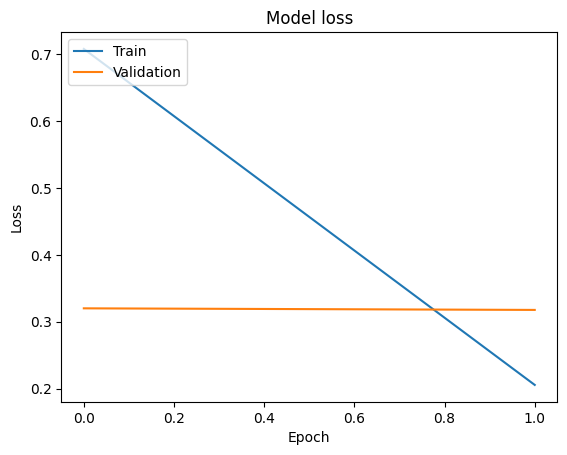

In [36]:
import matplotlib.pyplot as plt
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [41]:
random_cat = random.choice(os.listdir('Images/cat'))
cat_path = os.path.join('Images/cat',random_cat)
cat = load_image(cat_path)
random_dog = random.choice(os.listdir('Images/dog'))
dog_path = os.path.join('Images/dog',random_dog)
dog = load_image(dog_path)

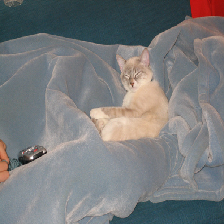

In [42]:
tf.keras.preprocessing.image.load_img(cat_path, target_size=(224,224))

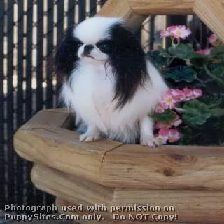

In [43]:
tf.keras.preprocessing.image.load_img(dog_path, target_size=(224,224))

In [44]:
print(f'''cat:{np.round(model.predict(cat),2)}''')

1/1 [==============================] - 0s 363ms/step
cat:[[0.88 0.12]]


In [45]:
print(f'''dog:{np.round(model.predict(dog),2)}''')

1/1 [==============================] - 0s 22ms/step
dog:[[0.47 0.53]]


In [46]:
fox_path = 'Images/red-fox-in-winter.jpg'
fox = load_image(fox_path)

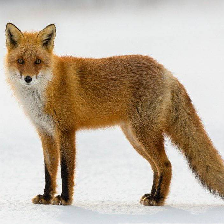

In [47]:
tf.keras.preprocessing.image.load_img(fox_path, target_size=(224,224))

In [48]:
print(f'''fox:{np.round(model.predict(fox),2)}''')

1/1 [==============================] - 0s 20ms/step
fox:[[0.48 0.52]]


# 2 Video Classification and Searching in python

https://zulko.github.io/moviepy/index.html

In [ ]:
# https://github.com/Zulko/moviepy
#!pip install --upgrade moviepy

https://github.com/kenshohara/video-classification-3d-cnn-pytorch.git

In [ ]:
#! git clone https://github.com/kenshohara/video-classification-3d-cnn-pytorch.git

In [ ]:
#!pip install torch torchvision torchaudio

move to the video classification directory

In [52]:
%cd video-classification-3d-cnn-pytorch/
!pwd

/Users/julianbesems/Documents/Work/UCL/RC11/2023:2024/Skills/SkillsClasses/01_Julian_VideoAndImageClassification/video-classification-3d-cnn-pytorch
/Users/julianbesems/Documents/Work/UCL/RC11/2023:2024/Skills/SkillsClasses/01_Julian_VideoAndImageClassification/video-classification-3d-cnn-pytorch


In [124]:
%cd ..

/Users/julianbesems/Documents/Work/UCL/RC11/2023:2024/Skills/SkillsClasses/01_Julian_VideoAndImageClassification


Imports necessary for the notebook

In [53]:
import json
import os
from moviepy.editor import *
from moviepy import *

------------------
## First write a small piece of code to load all movies on your onedrive into the input

Homework: Put this into a function for easier use

In [54]:
def loadVideosToInfile(folder):
    videos = os.listdir(folder)
    with open('input', 'w') as inputfile:
        for v in videos:
            if v.split('.')[-1] == 'mp4':
                inputfile.write(v+'\n')

In [58]:
loadVideosToInfile('../Input_films')

This is the command to run the main.py file of the model. The key words (noted by --) are followed with arguments. These can be checked in the opts.py file. 

In [59]:
! python main.py --input input --video_root ../Input_films --output ../output.json --model resnet-34-kinetics-cpu.pth --model_depth 34 --mode score --resnet_shortcut A --no_cuda


loading model resnet-34-kinetics-cpu.pth
../Input_films/sittingMindhunter.mp4
ffmpeg version 6.0 Copyright (c) 2000-2023 the FFmpeg developers
  built with Apple clang version 14.0.3 (clang-1403.0.22.14.1)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/6.0 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libaribb24 --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libsvtav1 --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-lib

There is a provided script that will reexport the video with the activity labels next to it. The activies can be looked up in class_names_list

In [60]:
! python generate_result_video/generate_result_video.py ../output.json ../input_films ../videos_pred class_names_list 5


../input_films/sittingMindhunter.mp4
ffmpeg version 6.0 Copyright (c) 2000-2023 the FFmpeg developers
  built with Apple clang version 14.0.3 (clang-1403.0.22.14.1)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/6.0 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libaribb24 --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libsvtav1 --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --

../input_films/KillBill.mp4
ffmpeg version 6.0 Copyright (c) 2000-2023 the FFmpeg developers
  built with Apple clang version 14.0.3 (clang-1403.0.22.14.1)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/6.0 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libaribb24 --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libsvtav1 --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-li

    Last message repeated 18 timesmes
[mjpeg @ 0x12bf04cf0] mjpeg_decode_dc: bad vlc: 0:0 (0x12d008a48)
[mjpeg @ 0x12bf04cf0] error dc
[mjpeg @ 0x12bf04cf0] error y=33 x=79
[mjpeg @ 0x12bf04cf0] overread 8
    Last message repeated 4 timesimes
[mjpeg @ 0x12bf04cf0] mjpeg_decode_dc: bad vlc: 0:0 (0x12d008a48)
[mjpeg @ 0x12bf04cf0] error dc
[mjpeg @ 0x12bf04cf0] error y=33 x=79
[mjpeg @ 0x12bf04cf0] overread 8
    Last message repeated 1 timesimes
[mjpeg @ 0x12bf04cf0] mjpeg_decode_dc: bad vlc: 0:0 (0x12d008a48)
[mjpeg @ 0x12bf04cf0] error dc
[mjpeg @ 0x12bf04cf0] error y=33 x=79
[mjpeg @ 0x12bf04cf0] overread 8
    Last message repeated 2 timesimes
[mjpeg @ 0x12bf04cf0] overread 8:00:05.59 bitrate= 749.7kbits/s speed=11.2x    
[mjpeg @ 0x12bf04cf0] mjpeg_decode_dc: bad vlc: 0:0 (0x12d008a48)
[mjpeg @ 0x12bf04cf0] error dc
[mjpeg @ 0x12bf04cf0] error y=33 x=79
[mjpeg @ 0x12bf04cf0] overread 8
    Last message repeated 4 timesimes
[mjpeg @ 0x12bf04cf0] mjpeg_decode_dc: bad vlc: 0:0 (0x12d

We are more interested in the data that's exported:

In [61]:
file = open('../output.json')
segments = json.load(file)

In [62]:
print(len(segments))

2


In [63]:
segments[0].keys()

dict_keys(['video', 'clips'])

In [85]:
segments[1]['video']

'KillBill.mp4'

In [86]:
segments[1]['clips']

[{'segment': [1, 16],
  'label': 'curling hair',
  'scores': [-1.7498420476913452,
   0.25360310077667236,
   2.8879148960113525,
   0.8697018623352051,
   3.7194268703460693,
   1.239732027053833,
   -0.34986022114753723,
   2.2136406898498535,
   -0.2663491368293762,
   0.39799052476882935,
   -1.0623807907104492,
   2.5669257640838623,
   2.1262171268463135,
   2.006545066833496,
   0.7007414698600769,
   0.45386090874671936,
   -0.9455937743186951,
   -0.5307260155677795,
   1.39865243434906,
   0.9232988953590393,
   2.007485866546631,
   0.8357412219047546,
   -2.6090877056121826,
   -0.703536331653595,
   0.6146785616874695,
   -3.0761196613311768,
   1.3798123598098755,
   -0.8248082399368286,
   -1.9844590425491333,
   1.1431115865707397,
   -1.4489346742630005,
   -0.31191661953926086,
   3.418087959289551,
   0.3054550290107727,
   -0.5834708213806152,
   1.7730411291122437,
   4.232975006103516,
   1.529616117477417,
   0.36541134119033813,
   -0.7548011541366577,
   -2.176

In [66]:
segments[0]['clips'][0].keys()

dict_keys(['segment', 'label', 'scores'])

In [67]:
segments[0]['clips'][0]['segment']

[1, 16]

In [70]:
segments[0]['clips'][0]['label']

'dining'

In [75]:
segments[0]['clips'][0]['scores']

[-1.440126895904541,
 2.3982701301574707,
 2.8316986560821533,
 2.340456008911133,
 -0.43171319365501404,
 0.6547898650169373,
 1.3255256414413452,
 2.13313889503479,
 -0.3045266568660736,
 2.957921028137207,
 -0.3077670931816101,
 2.8672399520874023,
 0.616958737373352,
 -0.7828947901725769,
 1.8090344667434692,
 1.0444540977478027,
 2.6553866863250732,
 -0.1695350557565689,
 1.0514813661575317,
 -1.6157723665237427,
 -1.9773178100585938,
 -0.6699233055114746,
 -1.7974001169204712,
 -2.014655828475952,
 0.9894407391548157,
 -2.423295021057129,
 1.489268183708191,
 1.7633558511734009,
 0.13473114371299744,
 0.9599679112434387,
 -3.6654555797576904,
 2.201465606689453,
 -0.5796136856079102,
 1.3455455303192139,
 0.07368993014097214,
 -0.7925760746002197,
 0.19300904870033264,
 0.5639380216598511,
 -1.3319714069366455,
 -1.2481216192245483,
 -1.4159858226776123,
 1.7067171335220337,
 -1.883347749710083,
 -0.14491789042949677,
 -0.02329518459737301,
 -2.019857883453369,
 0.613452315330505

In [73]:
len(segments[0]['clips'][0]['scores'])

400

In [74]:
classNames = []
with open('class_names_list', 'r') as class_names_list:
    index = 0
    for c in class_names_list:
        classNames.append({'index':index, 'name':c, 'score':0})
        index += 1


In [77]:
for i in range(len(segments[0]['clips'][0]['scores'])):
    score = segments[0]['clips'][0]['scores'][i]
    classNames[i]['score'] = score

In [78]:
classNames.sort(key = lambda x : x['score'], reverse = True)

In [79]:
classNames

[{'index': 91, 'name': 'dining\n', 'score': 6.5691938400268555},
 {'index': 242, 'name': 'playing poker\n', 'score': 6.219333171844482},
 {'index': 380, 'name': 'washing feet\n', 'score': 5.432800769805908},
 {'index': 224, 'name': 'playing chess\n', 'score': 4.5862135887146},
 {'index': 176, 'name': 'kissing\n', 'score': 4.438952922821045},
 {'index': 74, 'name': 'counting money\n', 'score': 4.104022979736328},
 {'index': 355, 'name': 'texting\n', 'score': 3.8714210987091064},
 {'index': 109, 'name': 'eating burger\n', 'score': 3.8142244815826416},
 {'index': 352, 'name': 'tasting beer\n', 'score': 3.699392080307007},
 {'index': 316, 'name': 'smoking\n', 'score': 3.653916120529175},
 {'index': 51, 'name': 'celebrating\n', 'score': 3.5824809074401855},
 {'index': 317, 'name': 'smoking hookah\n', 'score': 3.4999868869781494},
 {'index': 140,
  'name': 'giving or receiving award\n',
  'score': 3.4289958477020264},
 {'index': 79, 'name': 'crying\n', 'score': 3.387058973312378},
 {'index':

# Now that we know what's in the output, we start by being able to load film objects in python, so that we can start editing these. 

moviepy library

In [81]:
video = VideoFileClip(r"../Input_films/KillBill.mp4")
subVideo = video.subclip(10,15)
subVideo.write_videofile("../output_films/KillBill_10_15.mp4", audio_codec='aac')

Moviepy - Building video ../output_films/KillBill_10_15.mp4.
MoviePy - Writing audio in KillBill_10_15TEMP_MPY_wvf_snd.mp4


MoviePy - Done.
Moviepy - Writing video ../output_films/KillBill_10_15.mp4



Moviepy - Done !
Moviepy - video ready ../output_films/KillBill_10_15.mp4


In [82]:
subVideo.ipython_display()

Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [83]:
video.fps

23.976023976023978

In [84]:
frame_length = 1/video.fps

In [90]:
frame_length

0.04170833333333333

In [93]:
label_periods = []
for f in segments:
    print(f['video'])
    currentLabel = None
    ts = 0
    te = 0
    for c in f['clips']:
        label = c['label']
        s = c['segment'][0]
        e = c['segment'][1]
        if label == currentLabel:
            te = e 
        else:
            label_periods.append([(ts,te),currentLabel, f['video']])

            ts = s
            te = e 
            currentLabel = label

sittingMindhunter.mp4
KillBill.mp4


In [94]:
label_periods

[[(0, 0), None, 'sittingMindhunter.mp4'],
 [(1, 16), 'dining', 'sittingMindhunter.mp4'],
 [(17, 32), 'washing feet', 'sittingMindhunter.mp4'],
 [(33, 48), 'dining', 'sittingMindhunter.mp4'],
 [(0, 0), None, 'KillBill.mp4'],
 [(1, 32), 'curling hair', 'KillBill.mp4'],
 [(33, 48), 'dying hair', 'KillBill.mp4'],
 [(49, 64), 'stretching arm', 'KillBill.mp4'],
 [(65, 96), 'dying hair', 'KillBill.mp4'],
 [(97, 112), 'dining', 'KillBill.mp4'],
 [(113, 320), 'testifying', 'KillBill.mp4'],
 [(321, 336), 'ironing', 'KillBill.mp4'],
 [(337, 352), 'bookbinding', 'KillBill.mp4'],
 [(353, 368), 'folding clothes', 'KillBill.mp4'],
 [(369, 384), 'stretching arm', 'KillBill.mp4'],
 [(385, 432), 'testifying', 'KillBill.mp4'],
 [(433, 464), 'stretching leg', 'KillBill.mp4']]

In [95]:
len(label_periods)

17

In [96]:
longPeriods = []
for lp in label_periods:
    if lp[0][1]-lp[0][0] > 5/frame_length:
        longPeriods.append(lp)

In [97]:
longPeriods

[[(113, 320), 'testifying', 'KillBill.mp4']]

In [98]:
clips = []
for l in longPeriods:
    video = VideoFileClip(r"../Input_films/"+l[2])
    subclip = video.subclip(l[0][0]*frame_length,l[0][1]*frame_length)
    clips.append([subclip,l[1]+'_'+str(int(l[0][0]*frame_length))])

In [99]:
clips

[[<moviepy.video.io.VideoFileClip.VideoFileClip at 0x2e76931d0>,
  'testifying_4']]

In [100]:
clips[0][0].ipython_display()

Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [101]:
folderPath = '../output_films/'
for c in clips:
    c[0].write_videofile(folderPath + c[1] + '.mp4', audio_codec='aac')

Moviepy - Building video ../output_films/testifying_4.mp4.
MoviePy - Writing audio in testifying_4TEMP_MPY_wvf_snd.mp4


MoviePy - Done.
Moviepy - Writing video ../output_films/testifying_4.mp4



Moviepy - Done !
Moviepy - video ready ../output_films/testifying_4.mp4


# That's it for the categories, now see if we can search for our own activities apart from these

In [102]:
videos = os.listdir('../Input_films')

with open('input', 'w') as inputfile:
    for v in videos:
        if v.split('.')[-1] == 'mp4':
            inputfile.write(v+'\n')

In [103]:
!python main.py --input input --video_root ../input_films --output ../output/outputKBMH_features.json --model resnet-34-kinetics-cpu.pth --mode feature --no_cuda


loading model resnet-34-kinetics-cpu.pth
../input_films/sittingMindhunter.mp4
ffmpeg version 6.0 Copyright (c) 2000-2023 the FFmpeg developers
  built with Apple clang version 14.0.3 (clang-1403.0.22.14.1)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/6.0 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libaribb24 --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libsvtav1 --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-lib

In [104]:
file = open('../output/outputKBMH_features.json')
segments = json.load(file)

In [105]:
len(segments)

2

In [106]:
import numpy as np

In [107]:
for s in segments: print(s['video'])

sittingMindhunter.mp4
KillBill.mp4


In [108]:
print(segments[0]['clips'][0].keys())

dict_keys(['segment', 'features'])


In [109]:
mhFeatures = []
for s in segments[0]['clips']:
    mhFeatures.append(np.array(s['features']))  

In [110]:
print(len(mhFeatures))

4


In [111]:
print(len(mhFeatures[0]))

512


In [112]:
kbFeatures = []
for s in segments[1]['clips']:
    kbFeatures.append(np.array(s['features']))  

In [113]:
print(len(kbFeatures))

31


Homework: make the below piece of code into a function

In [114]:
bestRangeStart = 0
bestRangeScore = 100000000
for i in range(len(kbFeatures)-len(mhFeatures)):
    distance = 0
    for j in range(len(mhFeatures)):
        d = np.linalg.norm(kbFeatures[i+j]-mhFeatures[j])
        distance += d
    print(distance)
    if distance < bestRangeScore:
        bestRangeScore = distance
        bestRangeStart = i

81.65776376195186
79.88296326567082
80.76259929148642
78.74235438520569
75.73998856416436
76.3000324930554
75.00960118544322
77.47066645374338
76.88127774412726
76.19854807130116
76.50404333380692
77.45024247378817
77.63101638324403
78.23493187412645
79.29708033194835
79.73648449071126
77.87403401167384
77.42361383180561
78.33233178048633
78.46958239401957
79.00905153045186
77.15679219407289
74.31293775607938
73.5384340264071
74.69238109028882
75.63969522454093
78.95026015862636


In [115]:
bestRangeStart

23

Homework: make the code below into a function

In [116]:
kbVideo = VideoFileClip(r"../Input_films/KillBill.mp4")
tsfps = kbVideo.fps
tsFrameLength = 1/tsfps

nrFrames = len(mhFeatures)*16
startFrame = bestRangeStart*16

startTime = startFrame*tsFrameLength
endTime = startTime+nrFrames*tsFrameLength

kbMatchedMhVideo = kbVideo.subclip(startTime,endTime)

In [117]:
kbMatchedMhVideo.ipython_display()

Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [ ]:
kbMatchedMhVideo.write_videofile("../output_films/KBWithMH.mp4", audio_codec='aac')

# We can also automate the extraction of frames

In [118]:
kbMatchedMhVideo.duration

2.6693333333333342

In [119]:
frame = kbMatchedMhVideo.get_frame(0.5)

In [120]:
from PIL import Image

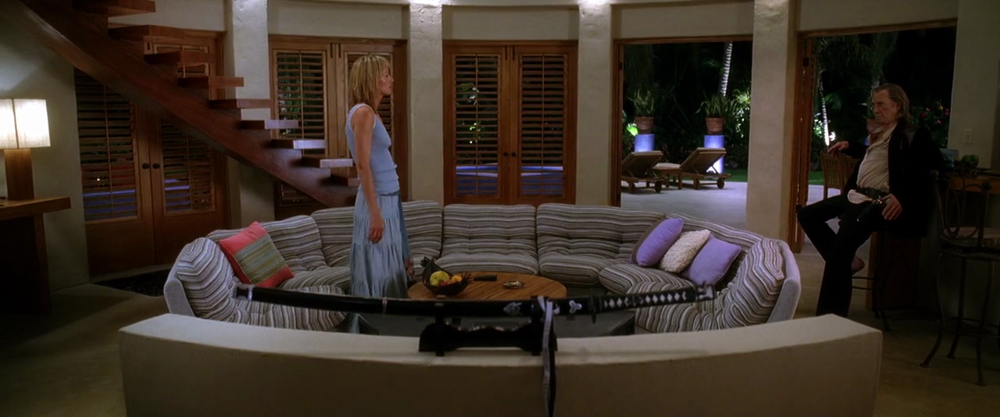

In [121]:
Image.fromarray(frame,'RGB')

# That's your main homework, implement a way to apply the image classification model to look for similar scenes in films. 